In [1]:
#import all the necessary packages.

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout
import pickle

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")

## 1) Loading the data

In [2]:
img_data = np.load('E:/BOOKS NEW/Cases datasets/amazon fashion/16k_data_cnn_features.npy')
asins = np.load('E:/BOOKS NEW/Cases datasets/amazon fashion/16k_data_cnn_feature_asins.npy')
data = pd.read_pickle('E:/BOOKS NEW/Cases datasets/amazon fashion/16k_apperal_data_preprocessed')
df_asins = list(data['asin'])
asins = list(asins)

In [3]:
with open('E:/BOOKS NEW/Cases datasets/amazon fashion/word2vec_model', 'rb') as handle:
    model = pickle.load(handle)

### 2) Weighted similarity using brand, color, product_type_name and Title.

In [4]:
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

#extra_features = hstack((brand_features, type_features, color_features)).tocsr()

idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

In [5]:
vocab = model.keys()
# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### IDF weighted Word2Vec for product similarity

In [6]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)
#print ("hi")

### Display an Image

In [7]:
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)

In [8]:
def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)

def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title2 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)
   
    data_matrix = [['Asin','Brand', 'Color', 'Product type'],
               [data['asin'].loc[df_id1],brands[doc_id1], colors[doc_id1], types[doc_id1]], # input apparel's features
               [data['asin'].loc[df_id2],brands[doc_id2], colors[doc_id2], types[doc_id2]]] # recommonded apparel's features
    
    colorscale = [[0, '#1d004d'],[.5, '#f2e5ff'],[1, '#f2e5d1']] # to color the headings of each column 
    
    # we create a table with the data_matrix
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    # plot it with plotly
    plotly.offline.iplot(table, filename='simple_table')
    
    # devide whole figure space into 25 * 1:10 grids
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25,5))
    
    # in first 25*10 grids we plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    # ploting the heap map based on the pairwise distances
    ax1 = sns.heatmap(np.round(s1_s2_dist,6), annot=True)
    # set the x axis labels as recommended apparels title
    ax1.set_xticklabels(sentance2.split())
    # set the y axis labels as input apparels title
    ax1.set_yticklabels(sentance1.split())
    # set title as recommended apparels title
    ax1.set_title(sentance2)

    # in last 25 * 10:15 grids we display image
    ax2 = plt.subplot(gs[:, 10:16])
    # we dont display grid lins and axis labels to images
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # pass the url it display it
    display_img(url, ax2, fig)
    
    plt.show()

### Text, brand and color features to recommend similar products

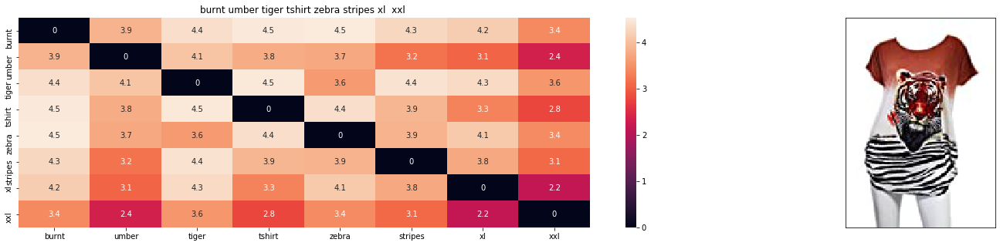

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 0.0


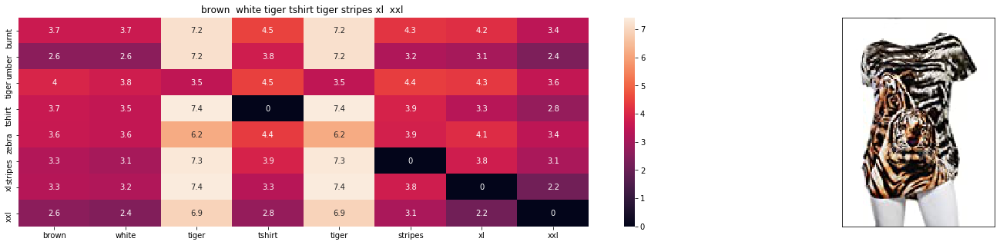

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 0.4352532704671224


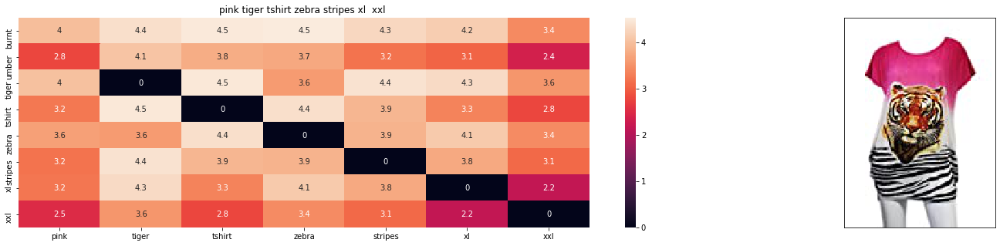

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 0.6678020637445229


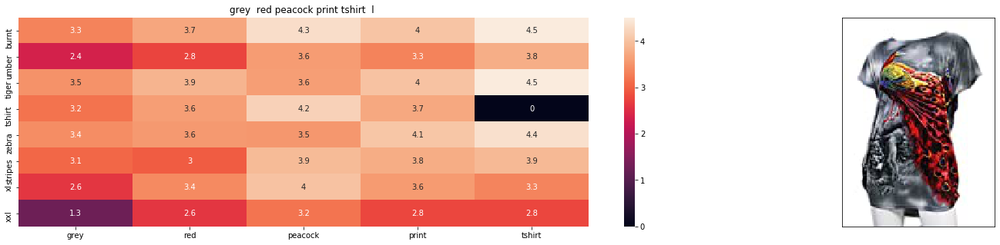

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 0.8248555502506671


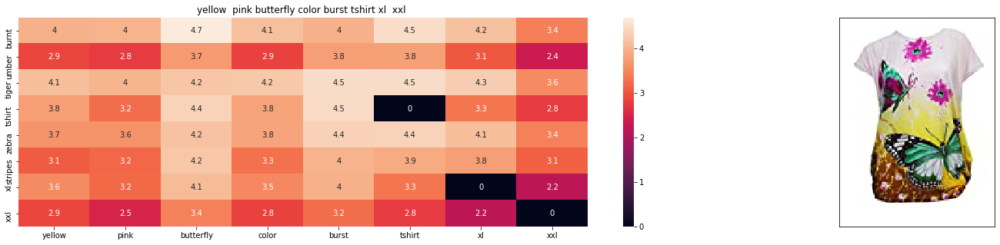

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 0.8457483928613442


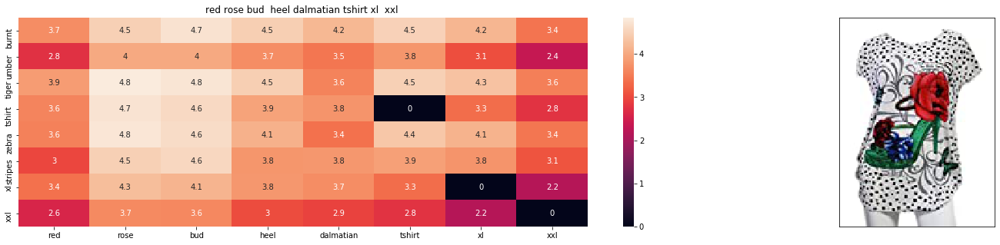

ASIN : B00JXQABB0
Brand : Si Row
euclidean distance from input : 0.8488989831221677


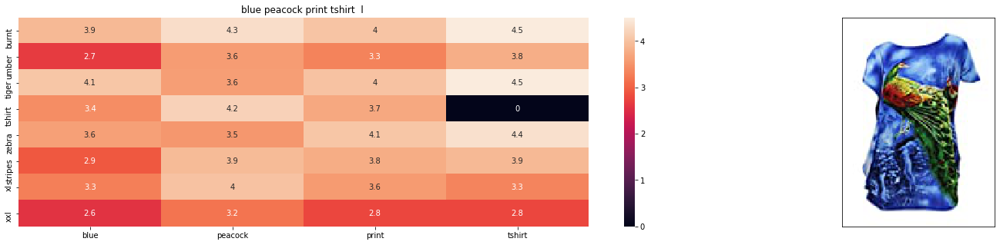

ASIN : B00JXQC8L6
Brand : Si Row
euclidean distance from input : 0.8545791627181151


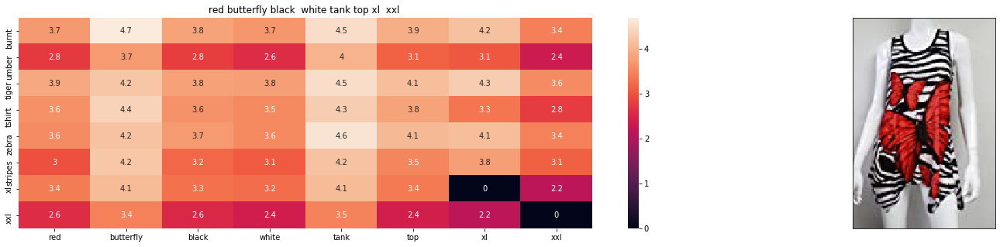

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 0.8631659191064613


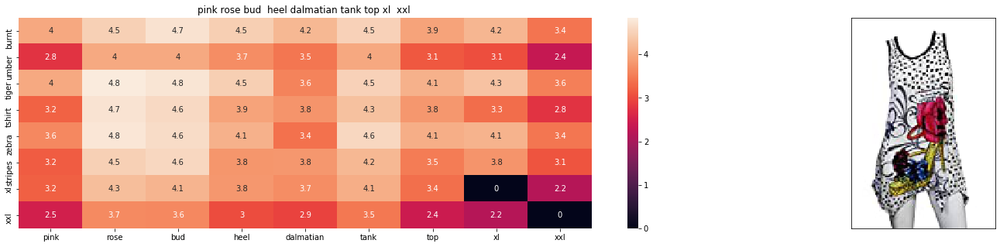

ASIN : B00JXQAX2C
Brand : Si Row
euclidean distance from input : 0.8824238778365232


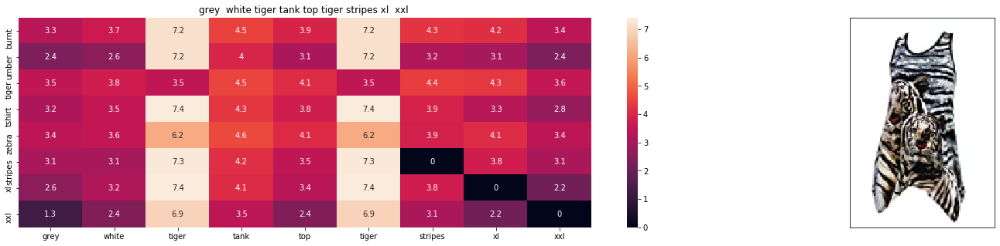

ASIN : B00JXQAFZ2
Brand : Si Row
euclidean distance from input : 0.886237843951839


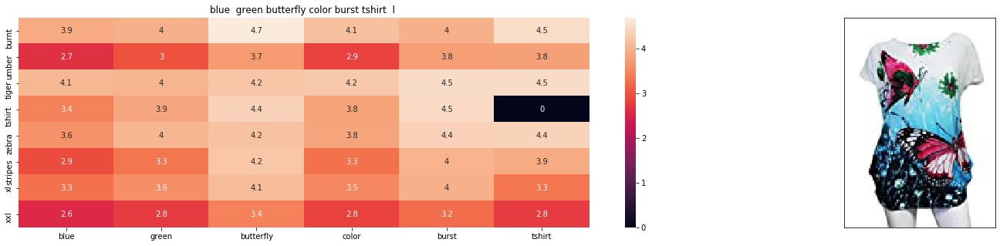

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 0.8999589921248533


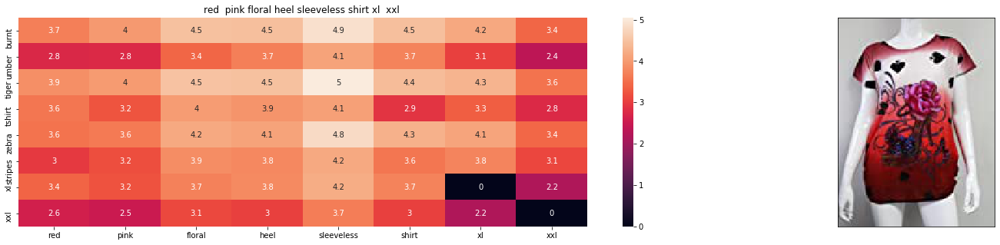

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 0.909993235390641


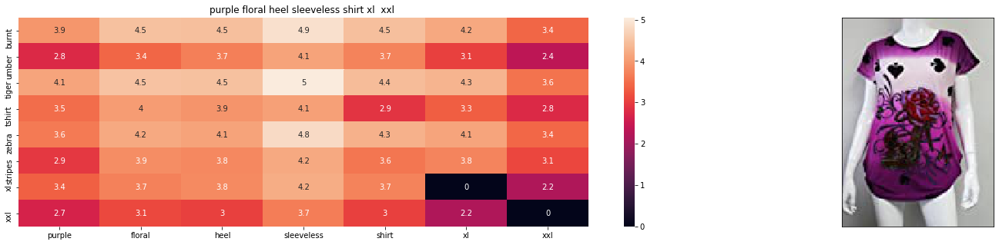

ASIN : B00JV63VC8
Brand : Si Row
euclidean distance from input : 0.938926855843522


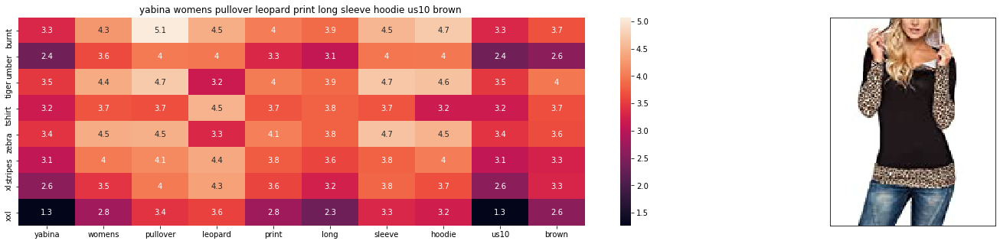

ASIN : B01KJUM6JI
Brand : YABINA
euclidean distance from input : 0.9869121257773535


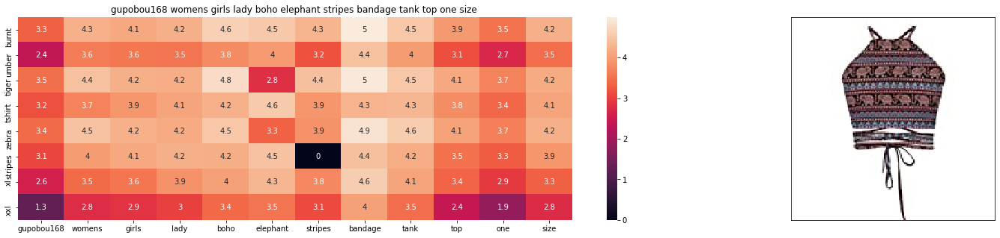

ASIN : B01ER184O6
Brand : GuPoBoU168
euclidean distance from input : 0.9888545696250098


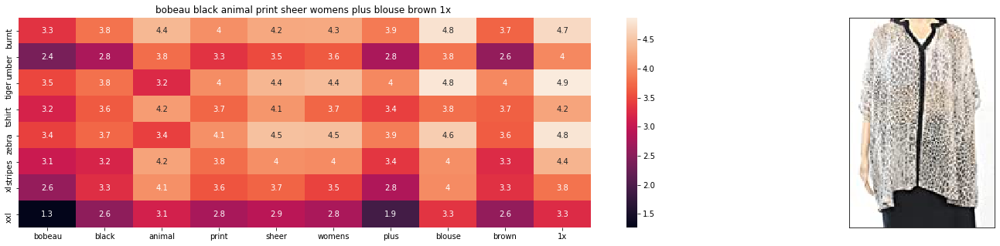

ASIN : B074MH886R
Brand : Bobeau
euclidean distance from input : 0.9939177537273861


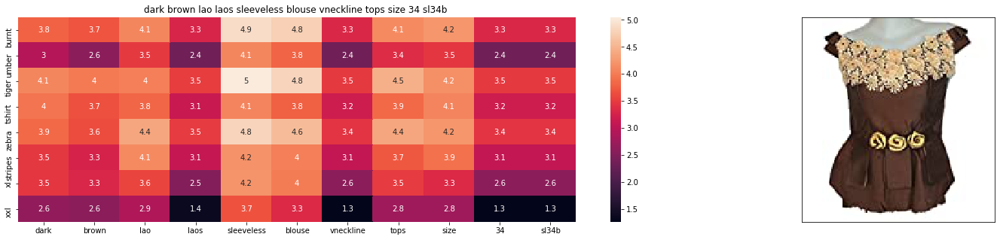

ASIN : B074J48RGW
Brand : Nanon
euclidean distance from input : 0.9976415340415137


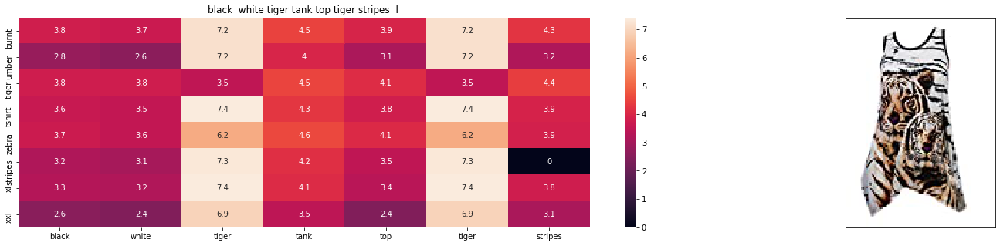

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 1.0013001125268715


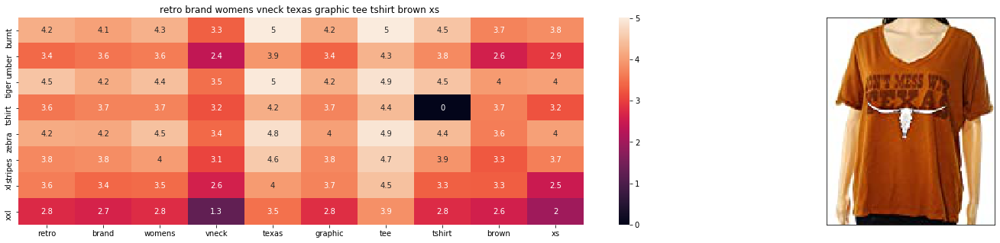

ASIN : B07317428N
Brand : Retro
euclidean distance from input : 1.0022914592734473


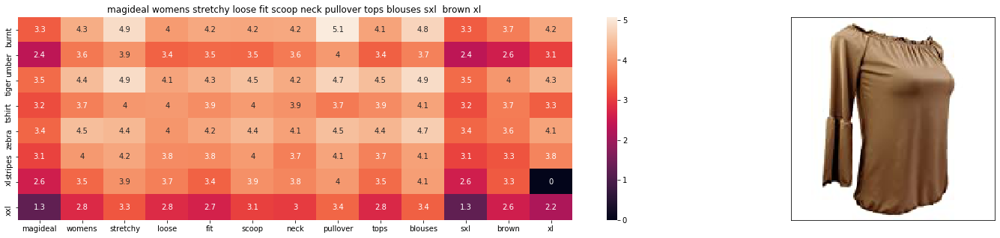

ASIN : B07515JFBF
Brand : MagiDeal
euclidean distance from input : 1.0094845795940854


In [9]:
def idf_w2v_brand(doc_id, w1, w2, w3, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features

    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist)/float(w1 + w2 + w3)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

# Assignment 24 - Add Images also to the features.

### Text, brand, color and image features to recommend similar products

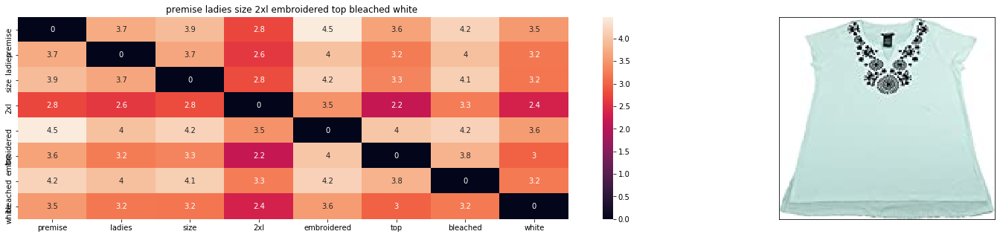

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.1045153165678372


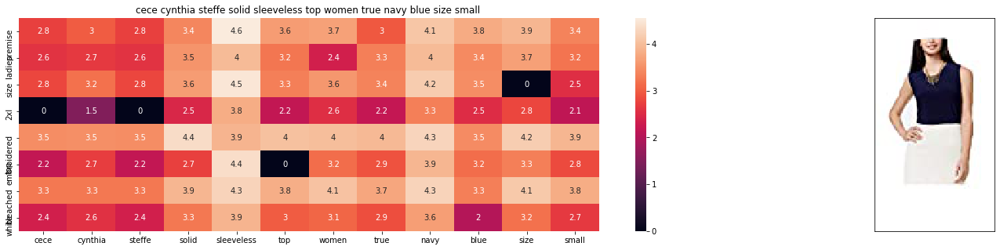

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 10.33269948261771


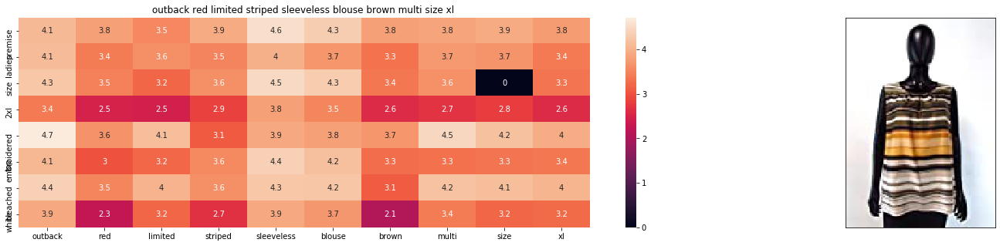

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 13.424574447400643


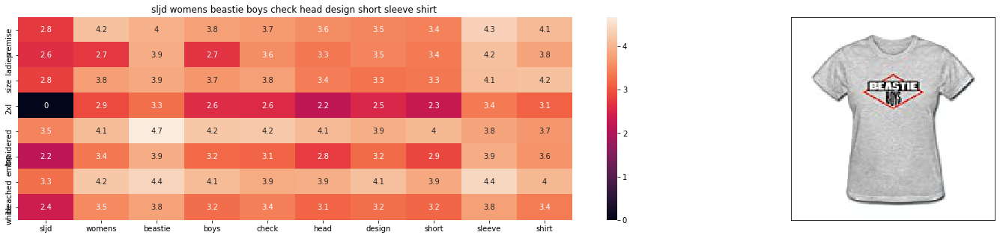

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 14.352194888426347


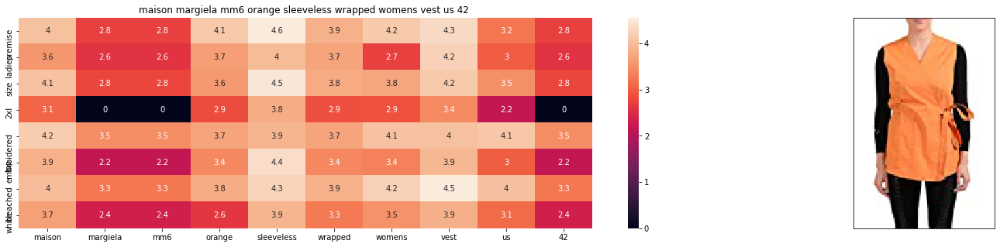

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 15.448520547163511


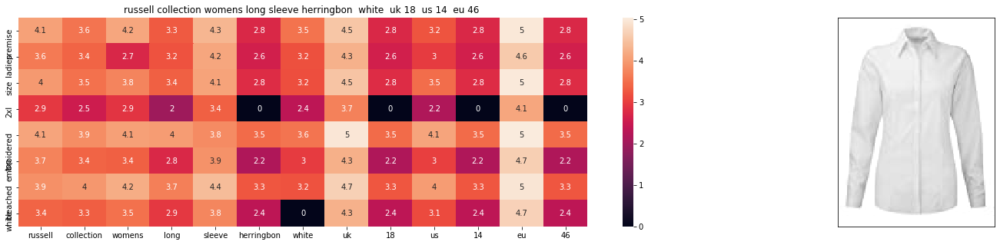

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 15.499377453075446


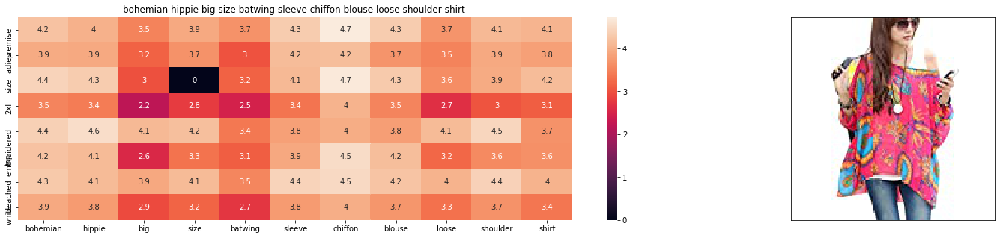

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 15.536552486997662


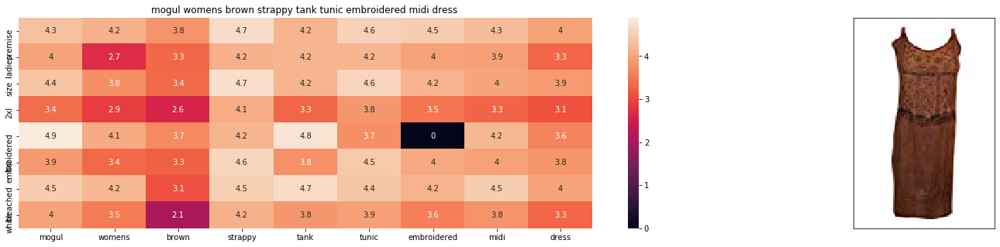

ASIN : B07191F766
Brand : Mogul Interior
euclidean distance from input : 15.56148607080633


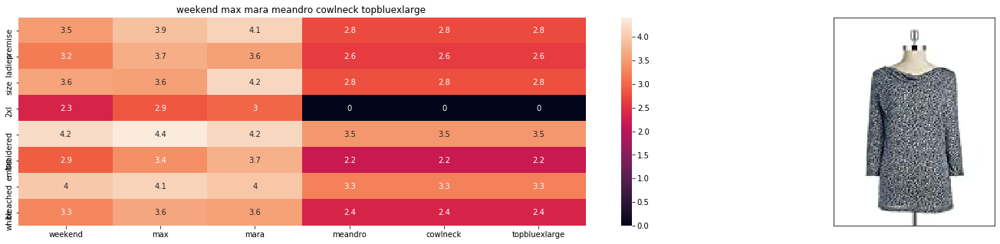

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 15.561753404264048


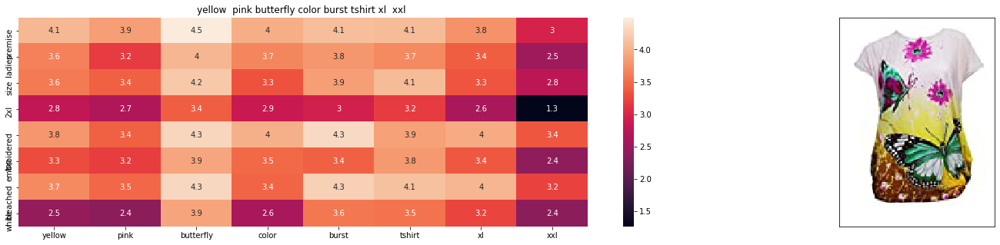

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 15.585043704980484


In [10]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 8, 5, 10, 10, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving more importance to Image

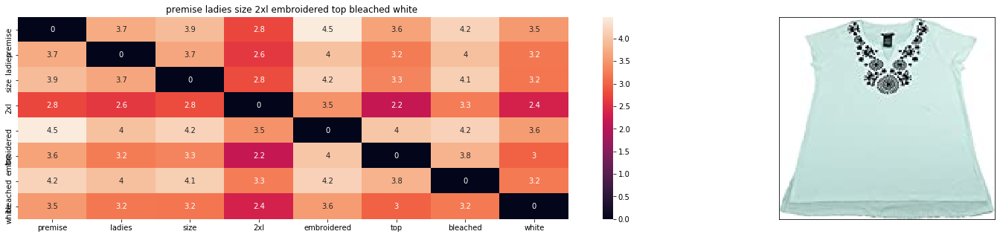

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 0.36712841155374515


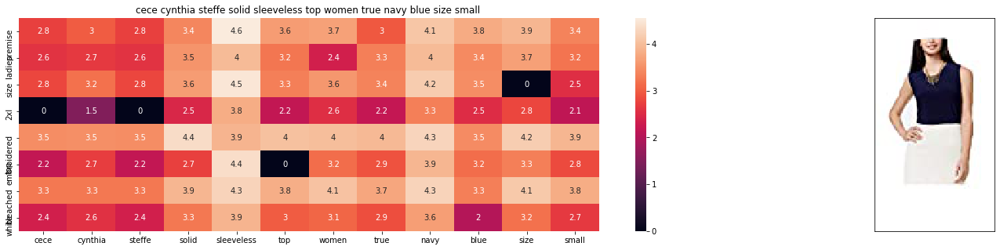

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 23.542071281148907


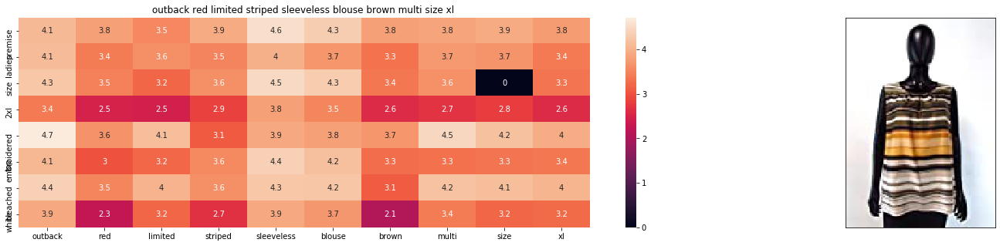

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 32.07008908345149


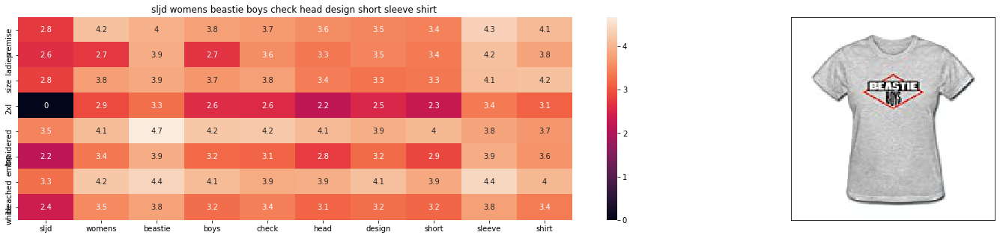

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 34.19231827134178


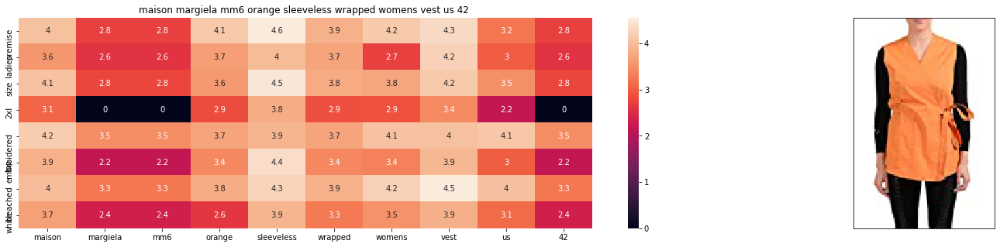

ASIN : B01MXI5L4G
Brand : Maison Margiela MM6
euclidean distance from input : 36.83129417096312


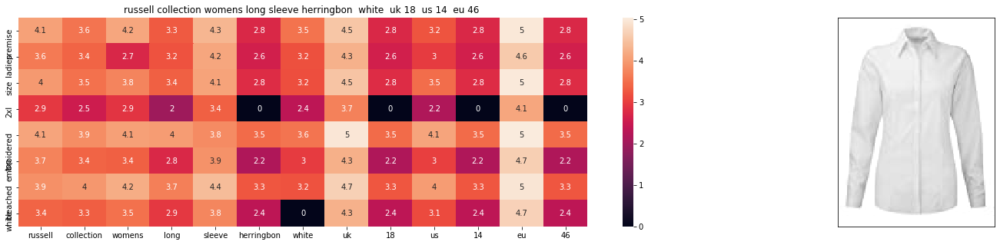

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 37.06673358039701


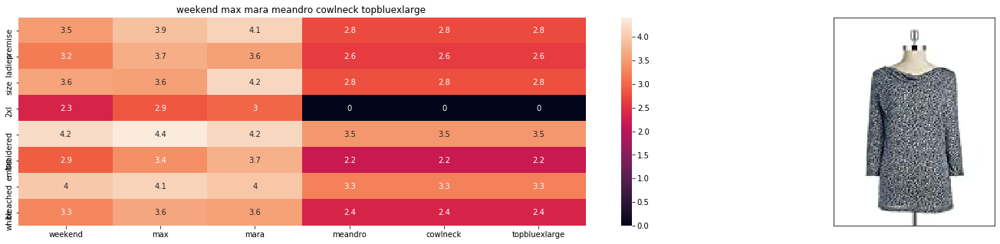

ASIN : B01MG83UB4
Brand : MaxMara
euclidean distance from input : 37.20240193939035


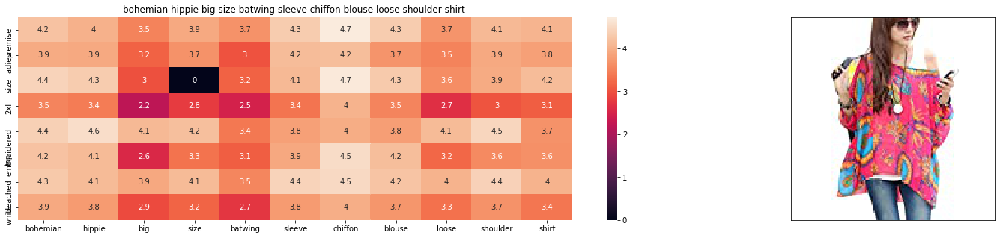

ASIN : B00YC92VRU
Brand : Display Promotion
euclidean distance from input : 37.307309312086836


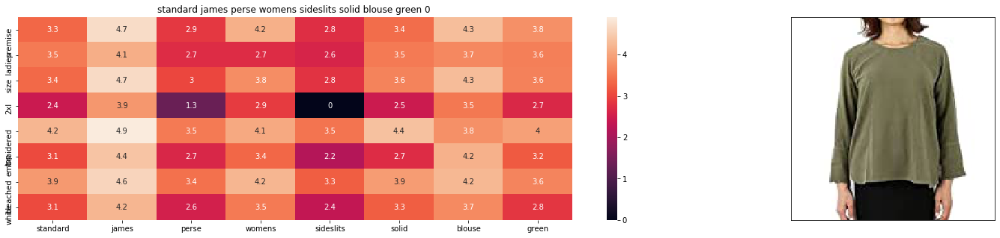

ASIN : B071LMW4YG
Brand : Standard James Perse
euclidean distance from input : 37.38746971100688


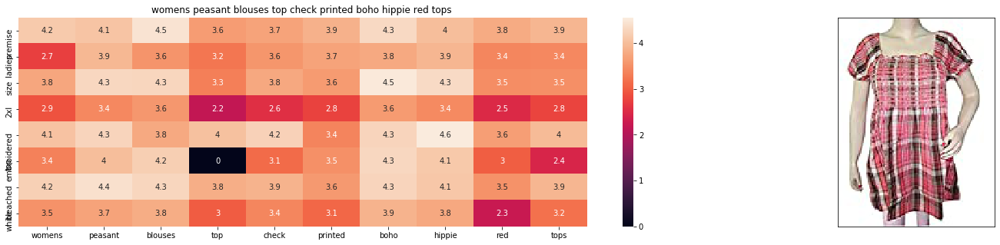

ASIN : B01MXMG6KB
Brand : Mogul Interior
euclidean distance from input : 37.39857839440411


In [11]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 5, 50, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving more importance to brand features

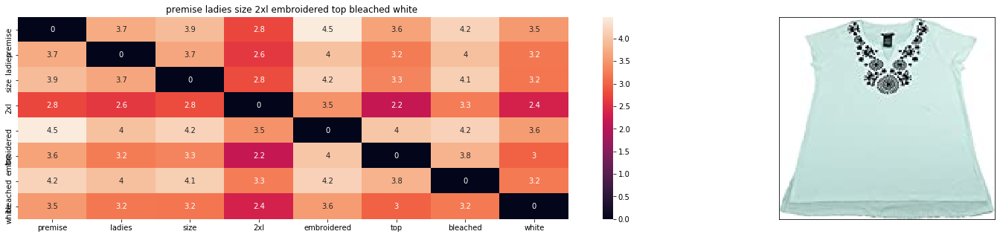

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.566237556436003


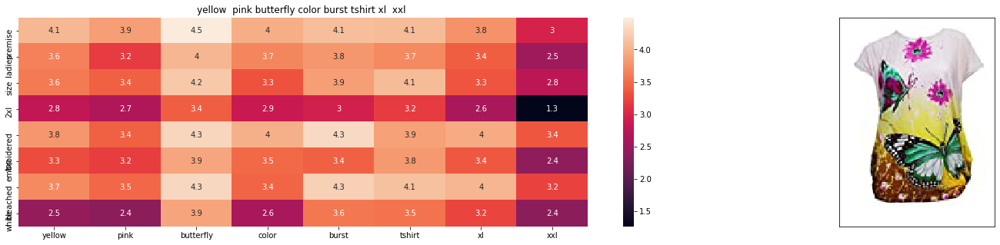

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 3.9734808115136757


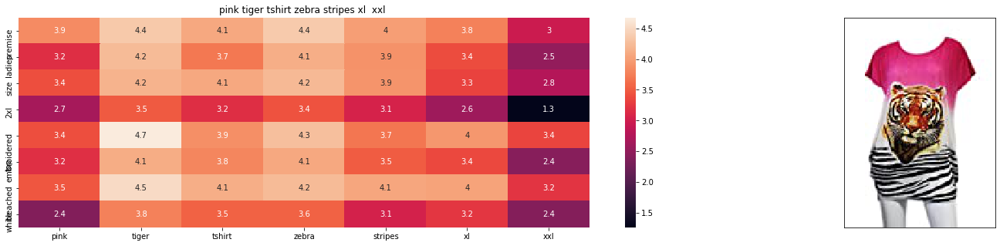

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.313677072552823


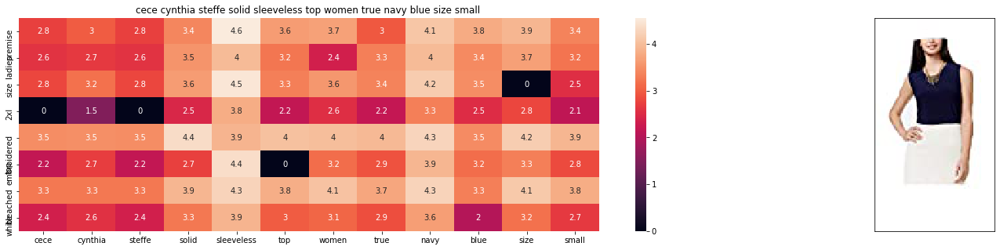

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 4.433907404157454


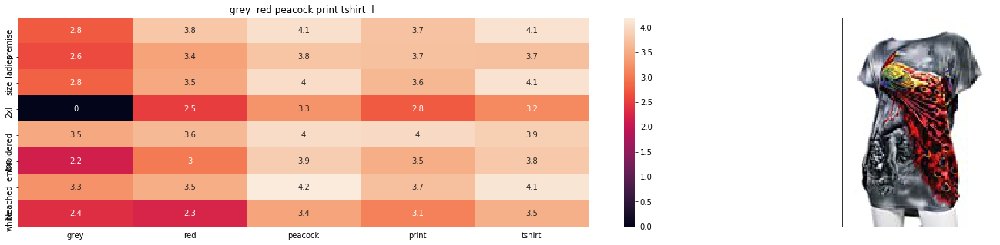

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 4.452019324697269


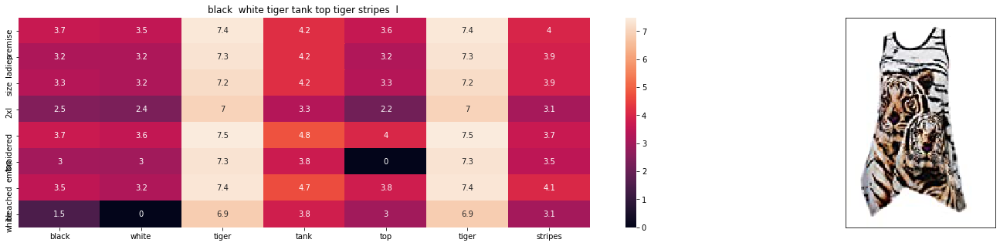

ASIN : B00JXQAO94
Brand : Si Row
euclidean distance from input : 4.481060336214134


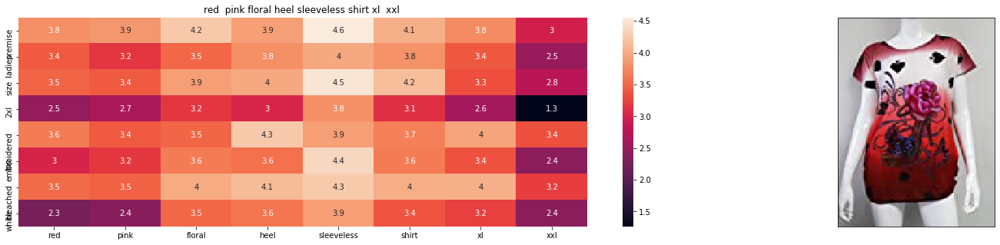

ASIN : B00JV63QQE
Brand : Si Row
euclidean distance from input : 4.541061577457937


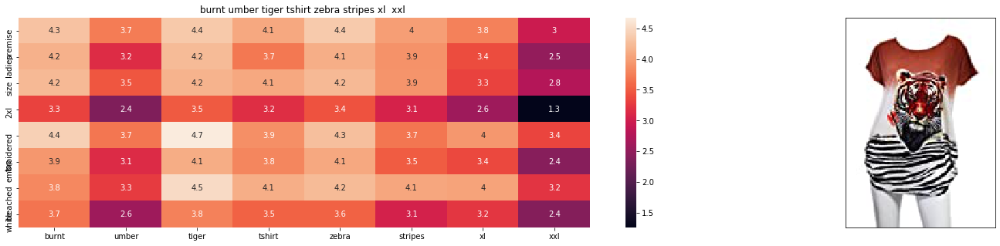

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 4.543249981219952


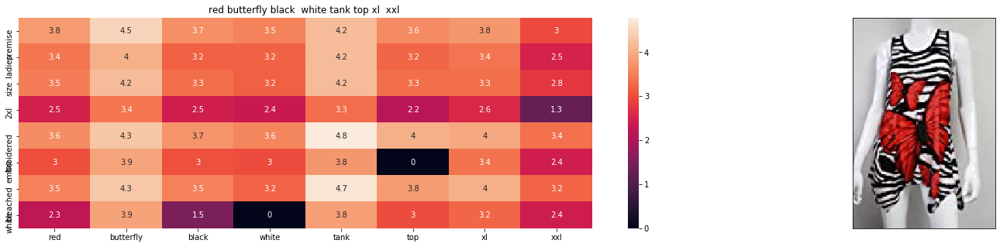

ASIN : B00JV63CW2
Brand : Si Row
euclidean distance from input : 4.61899334836952


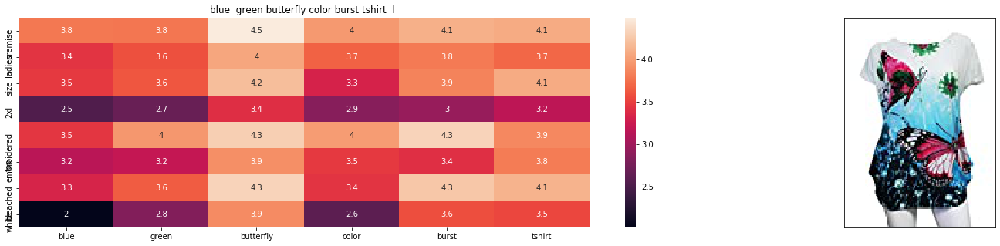

ASIN : B00JXQC0C8
Brand : Si Row
euclidean distance from input : 4.646826098543236


In [12]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 50, 5, 5, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving more importance to color features

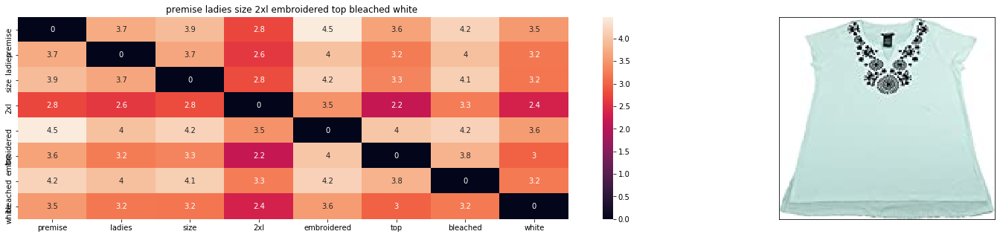

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.566237556436003


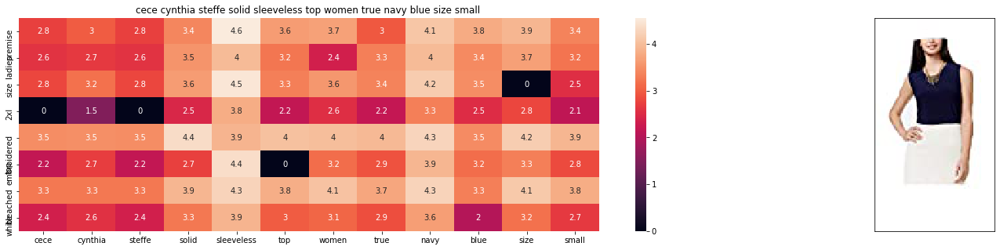

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 3.937218910547553


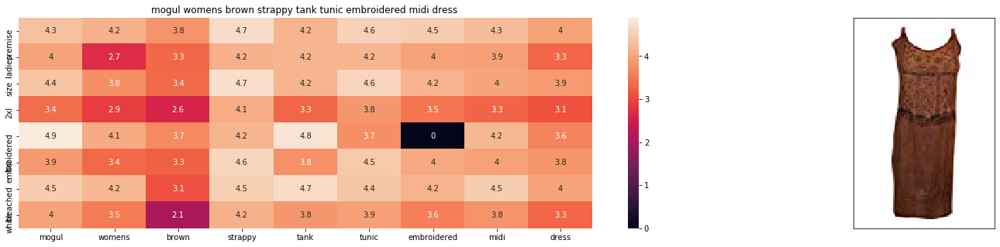

ASIN : B07191F766
Brand : Mogul Interior
euclidean distance from input : 4.050914236215445


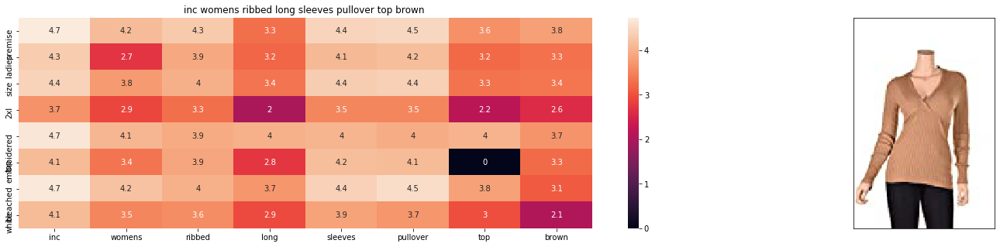

ASIN : B010OVNTHA
Brand : INC International Concepts
euclidean distance from input : 4.111069665730904


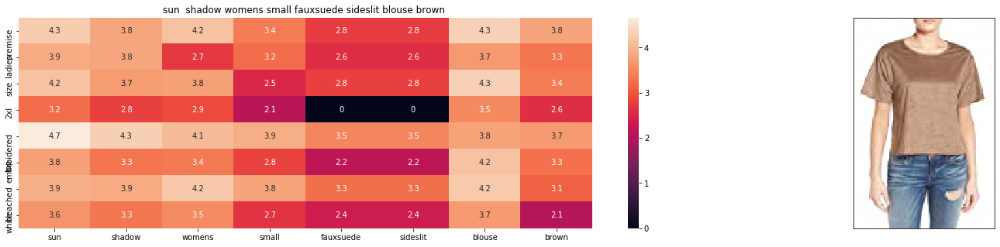

ASIN : B072VG4MV6
Brand : Sun & Shadow
euclidean distance from input : 4.129265029613788


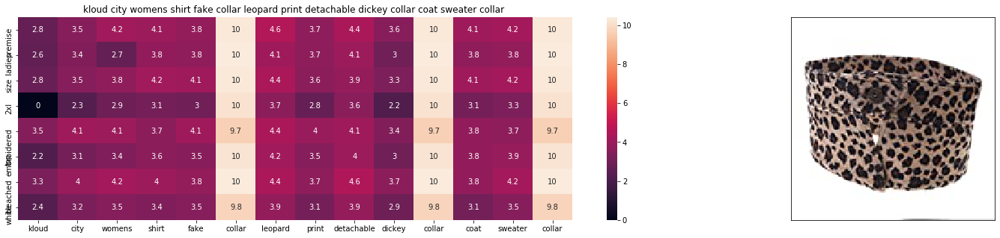

ASIN : B01NBM80SP
Brand : KLOUD City
euclidean distance from input : 4.153491680438702


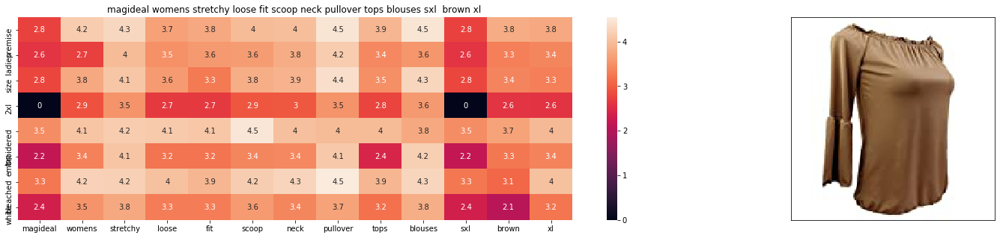

ASIN : B07515JFBF
Brand : MagiDeal
euclidean distance from input : 4.188003709323395


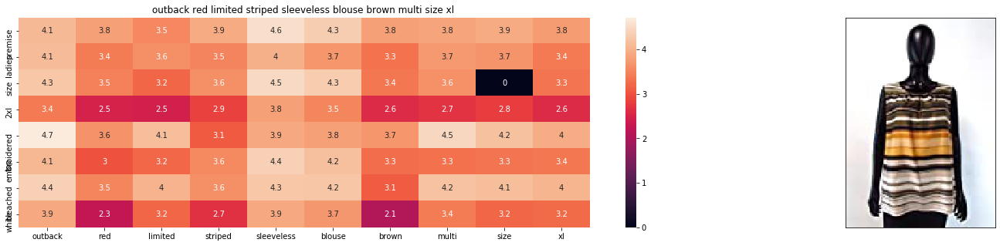

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 4.197006995861347


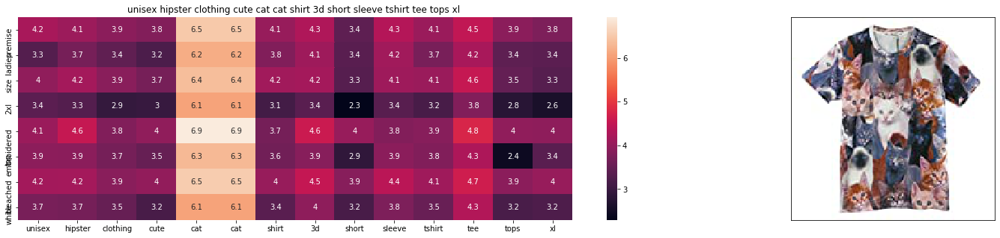

ASIN : B00OM4EF60
Brand : Moji
euclidean distance from input : 4.222889988796332


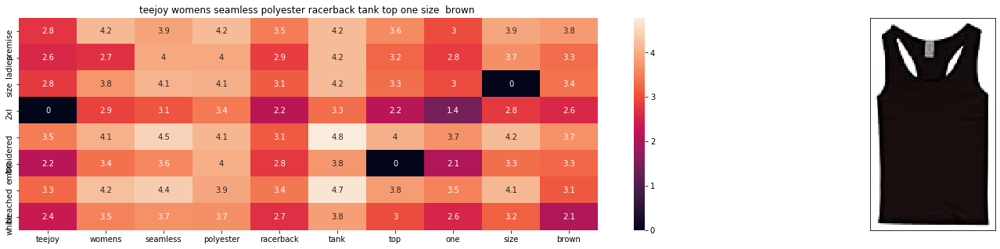

ASIN : B00JPOYCCO
Brand : Sofra
euclidean distance from input : 4.223628462835263


In [13]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 5, 5, 50, 5, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving more importance to w2v vectors

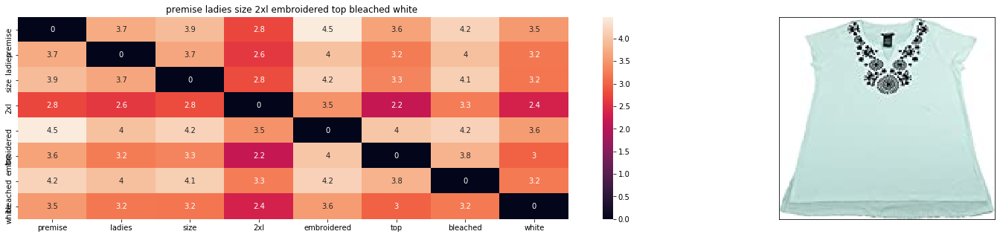

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.2730274411223932


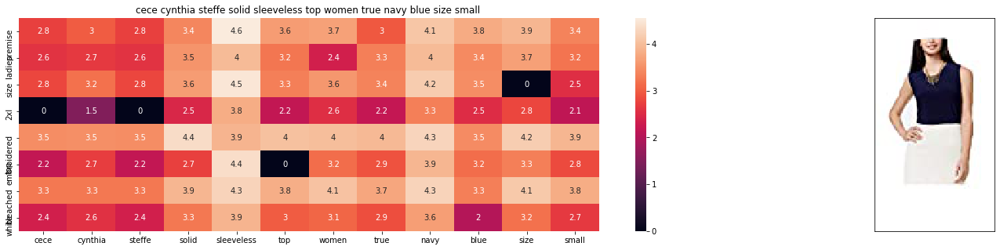

ASIN : B01N4NQ7LX
Brand : CeCe by Cynthia Steffe
euclidean distance from input : 3.6821910465039442


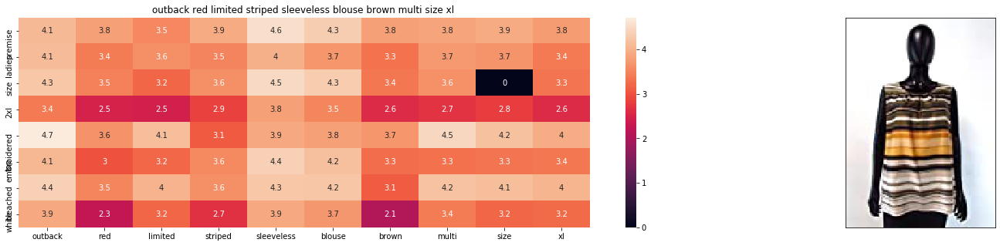

ASIN : B01IU645VU
Brand : Outback Red
euclidean distance from input : 4.404683039738582


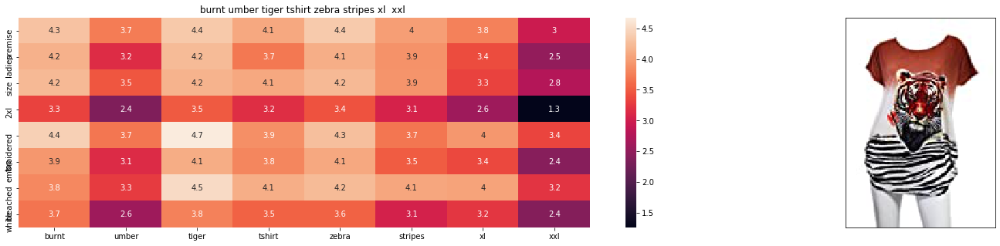

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 4.543249981219952


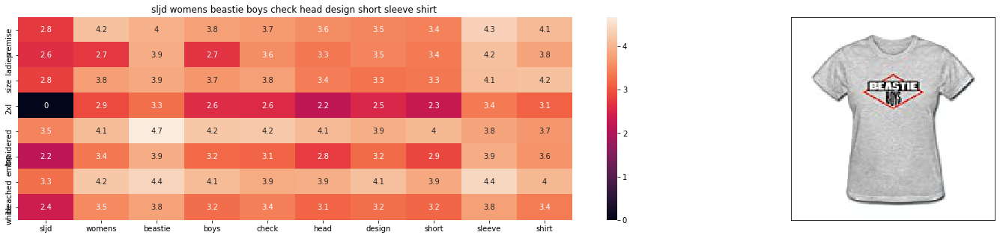

ASIN : B01FQLKKMK
Brand : SLJD
euclidean distance from input : 4.666886645682134


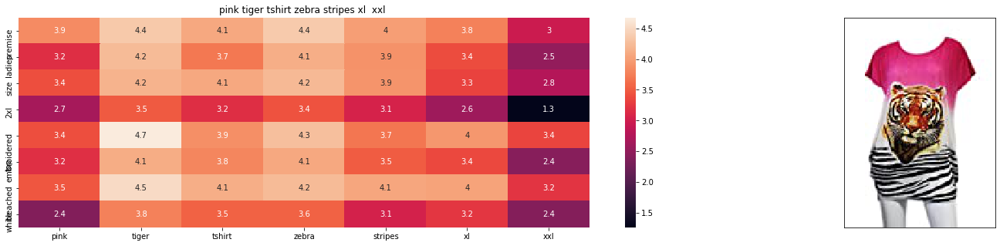

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 4.721579654427964


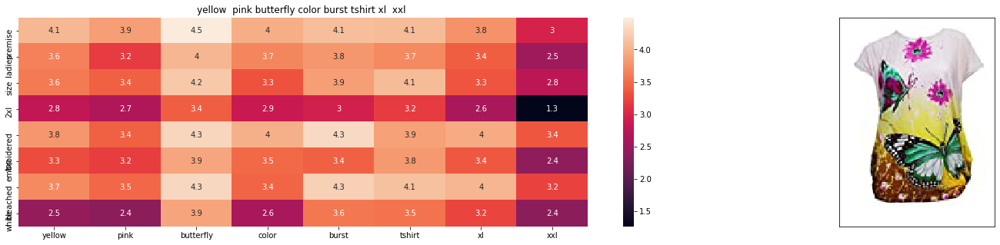

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 4.750964238121248


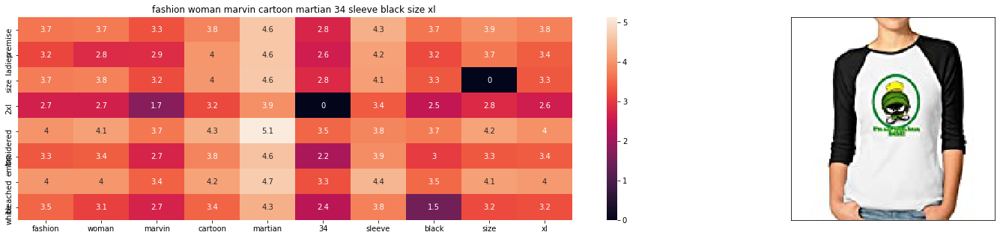

ASIN : B01FRPIX2Y
Brand : LOVELIF Sleeve Raglan
euclidean distance from input : 4.909397126414501


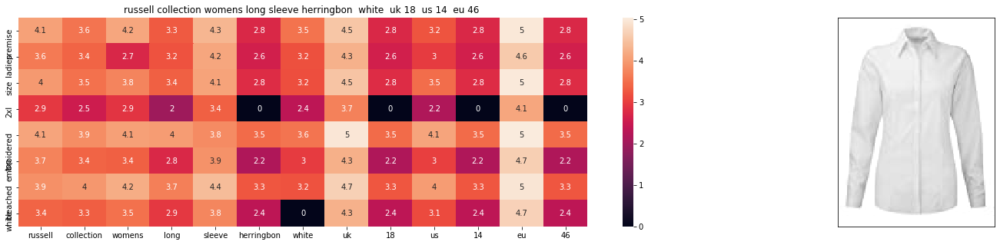

ASIN : B00K77AN5S
Brand : Russell Collection
euclidean distance from input : 4.9095434335839885


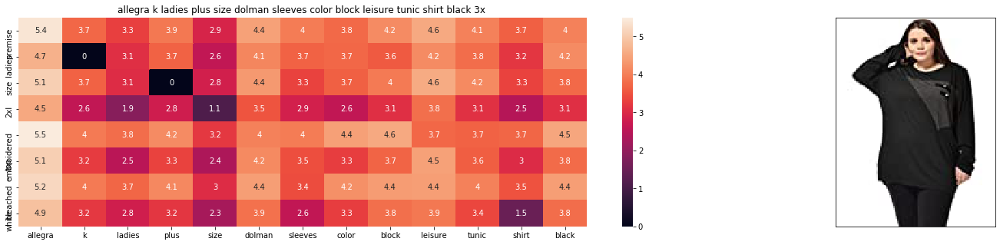

ASIN : B00D2J5HPO
Brand : Kaia
euclidean distance from input : 4.917110832506053


In [14]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 50, 5, 5, 5, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

## Giving more importance to w2v vectors,brand and color.

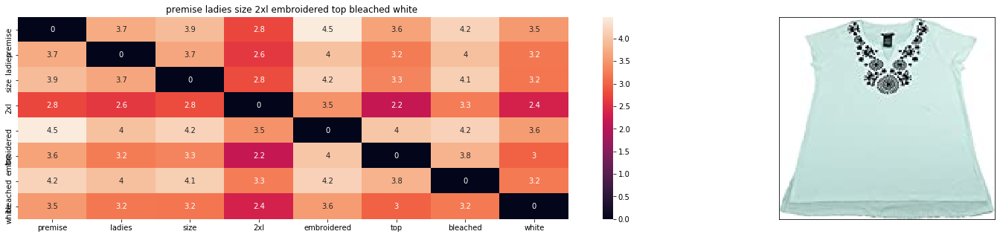

ASIN : B01M0IDUCV
Brand : Premise
euclidean distance from input : 1.5395571377687387


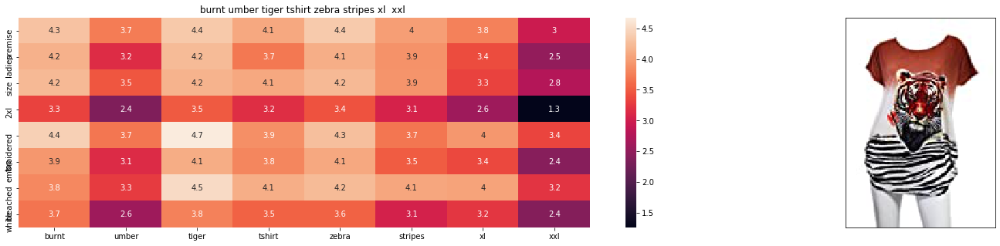

ASIN : B00JXQB5FQ
Brand : Si Row
euclidean distance from input : 1.9052338630922379


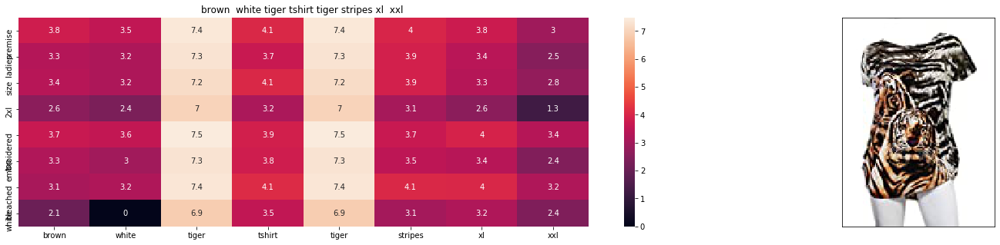

ASIN : B00JXQCWTO
Brand : Si Row
euclidean distance from input : 2.328816616919733


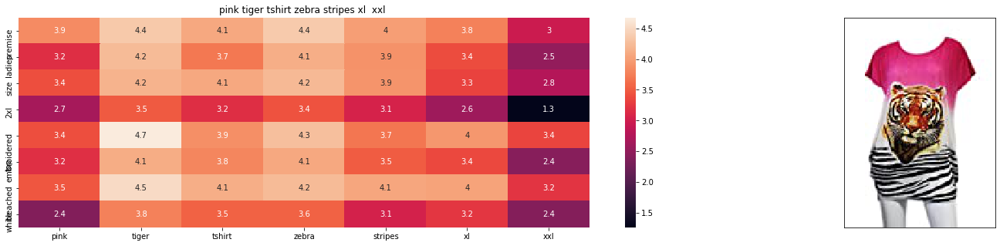

ASIN : B00JXQASS6
Brand : Si Row
euclidean distance from input : 2.390595405449077


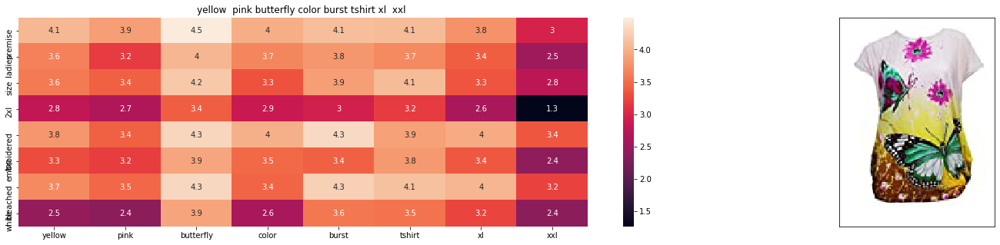

ASIN : B00JXQBBMI
Brand : Si Row
euclidean distance from input : 2.402917972804325


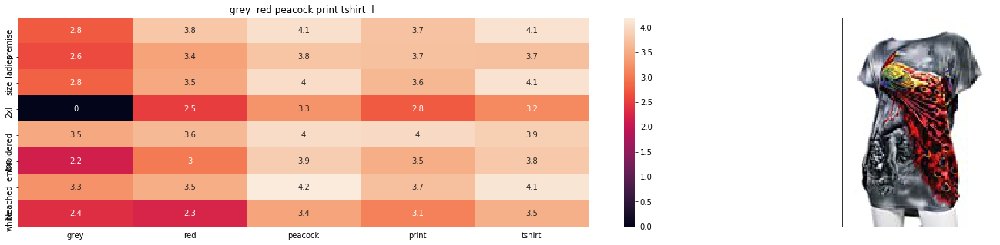

ASIN : B00JXQCFRS
Brand : Si Row
euclidean distance from input : 2.585398397254615


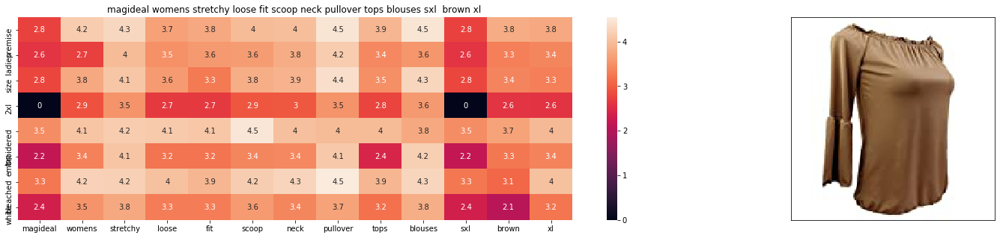

ASIN : B07515JFBF
Brand : MagiDeal
euclidean distance from input : 2.6354881125411196


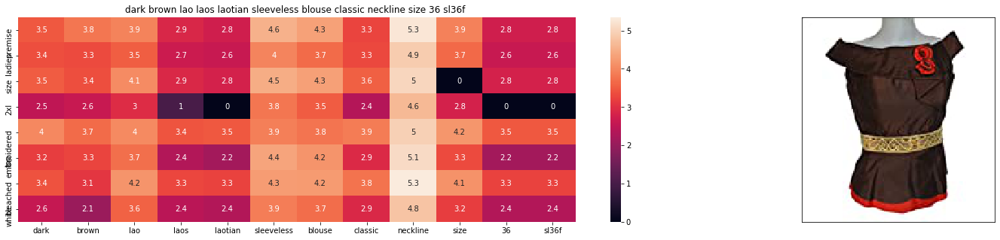

ASIN : B074J7BCYM
Brand : Nanon
euclidean distance from input : 2.665315599625293


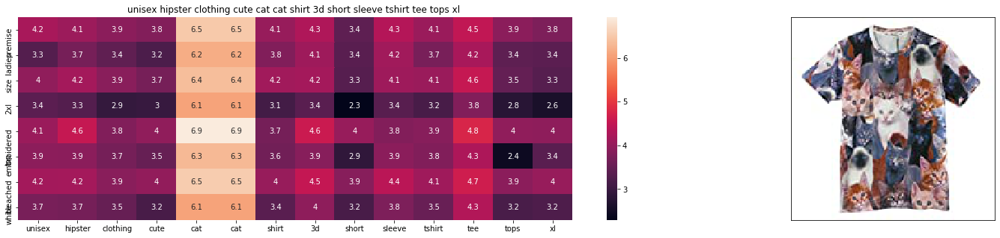

ASIN : B00OM4EF60
Brand : Moji
euclidean distance from input : 2.6656226950606507


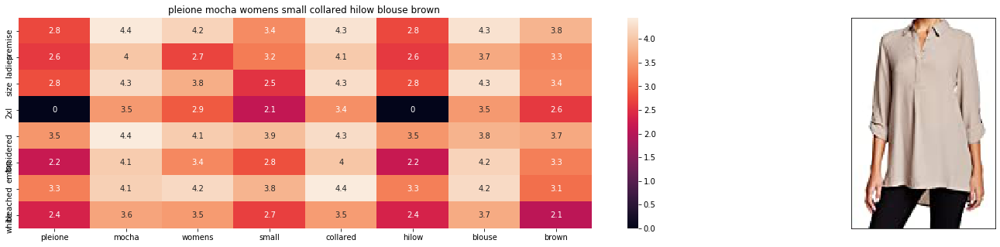

ASIN : B074NBD9C7
Brand : Pleione
euclidean distance from input : 2.678005153162969


In [15]:
def idf_w2v_brand(doc_id, w1, w2, w3, w4, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand features
    # w3: weight for color features
    # w4: weight for image
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    # https://github.com/saicharanarishanapally/Apparel-Recommendation/blob/master/apparel%20Recommendations%20using%20recommended%20weighted.ipynb
    # http://scikit-learn.org/stable/modules/metrics.html#cosine-similarity
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    brand_dist = pairwise_distances(brand_features, brand_features[doc_id])
    color_dist = pairwise_distances(color_features, color_features[doc_id])
    
    doc_id = asins.index(df_asins[doc_id])
    img_dist = pairwise_distances(img_data, img_data[doc_id].reshape(1,-1))
    
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * brand_dist + w3 * color_dist + w4 * img_dist)/float(w1 + w2 + w3 + w4)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(12566, 50, 50, 50, 5, 10)
# in the give heat map, each cell contains the euclidean distance between words i, j

# Observations

1. Giving Image features more importance gave us the WORST euclidean distance when compared to all the other.
2. Giving all the 4 features approx equal weightage gave us better results.
3. Giving more importance i.e weightage to brand features or Color Features or W2V Features (INDIVIDUALLY) gave us the almost the same  euclidean distances but, better than the previous cases.
4. Giving more weightage to brand features, color features and w2v vectors (combined) gave us the BEST euclidean distance.